In [1]:
using Pkg
Pkg.activate("C:/Users/lisah/Documents/Repos/ma-code")
include("c:/Users/lisah/Documents/Repos/ma-code/src/src.jl")
using .Src

  Activating project at `C:\Users\lisah\Documents\Repos\ma-code`


In [2]:
# set true model parameters
a_true = 0.5 # left of bifurcation point
m_true = 0.45
n0_true = 1.5
w0 = 1.0
M = 100 # number of measurements
noise = 0.5

# create parameter object for trial
hprm = Hyperprm(w0, n0_true, a_true, m_true, M, noise);

## fixed time window, observe from t=0

In [3]:
# infer a,m parameter
prm_keys = [:a, :m]

# observation time window fixed
t_fixed = true

true

In [4]:
# inverse uq and practica identifiability
r = assess_practical_identifiability(prm_keys, hprm, t_fixed=t_fixed)

(mle = [0.47924216542222375, 0.5096552849072286], plot_mles = Plot{Plots.GRBackend() n=12}, plot_losses = Plot{Plots.GRBackend() n=3}, cor = [1.0 0.22713575612380782; 0.22713575612367254 1.0], cov = [0.0052914649311717864 0.0017395298312652908; 0.0017395298312642548 0.011084518319582149], gaussian_heatmap = Plot{Plots.GRBackend() n=1}, gaussian_surface = Plot{Plots.GRBackend() n=2})

In [5]:
# forward uq
rf = forward_uq(r.mle, r.cov, prm_keys, [a_true, m_true], t_fixed=t_fixed)

(trajectories = Plot{Plots.GRBackend() n=204}, sample_dens_n = Plot{Plots.GRBackend() n=2}, sample_dens_w = Plot{Plots.GRBackend() n=2})

#### analyze plots

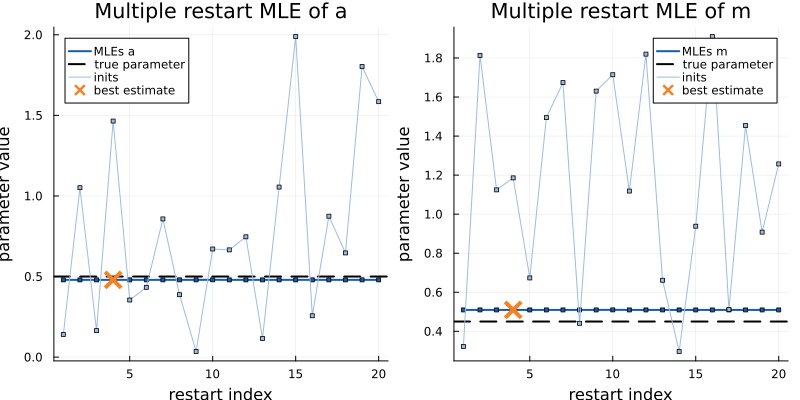

In [6]:
r.plot_mles

MLE is very close to true value and MLE is found in every optimization restart

In [7]:
r.cor

2×2 Matrix{Float64}:
 1.0       0.227136
 0.227136  1.0

correlation of a and m is quite low, which is also depicted in the surface of the Gaussian.

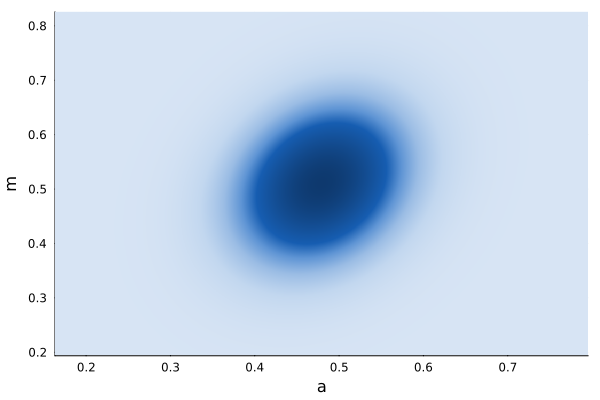

In [8]:
r.gaussian_heatmap

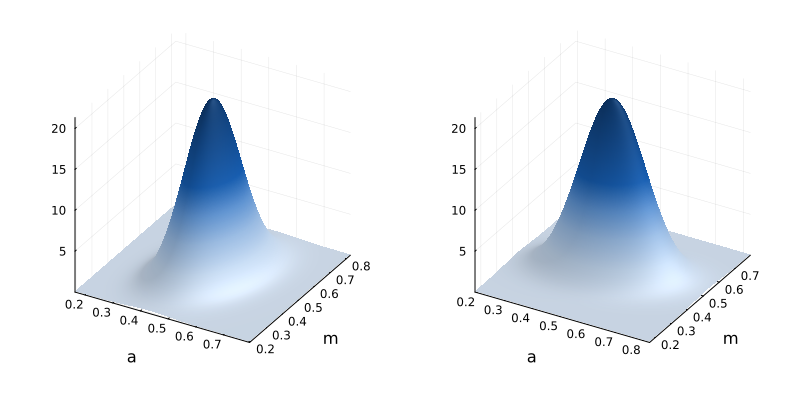

In [9]:
r.gaussian_surface

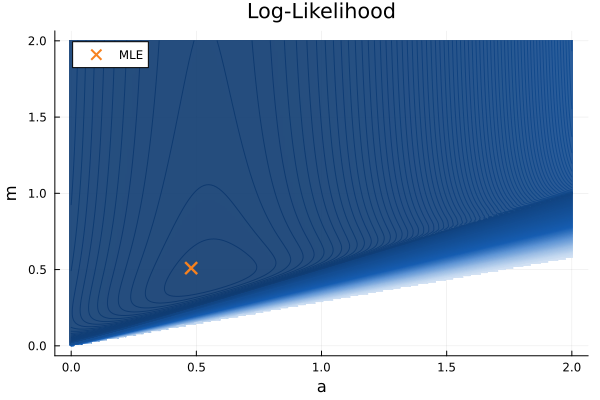

In [10]:
analyze_ll(r.mle, prm_keys, hprm, -1000, t_fixed=t_fixed)

Q: it seems like MLE is not at maximum? -> maybe curve around maximum is comparably flat, so not enough levels are shown in the plot to clearly mark the maximum

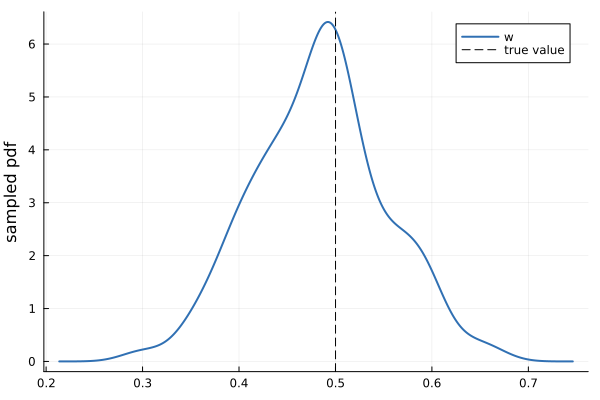

In [11]:
rf.sample_dens_w

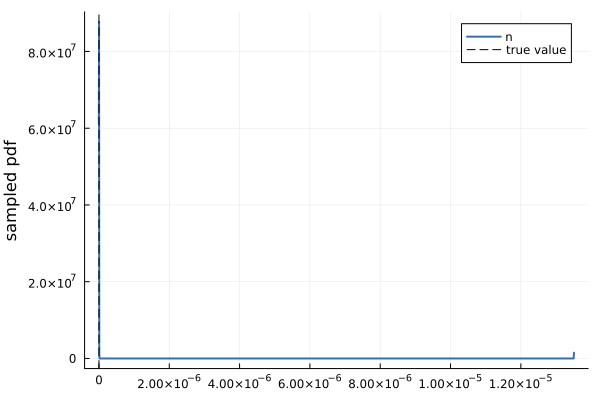

In [12]:
rf.sample_dens_n

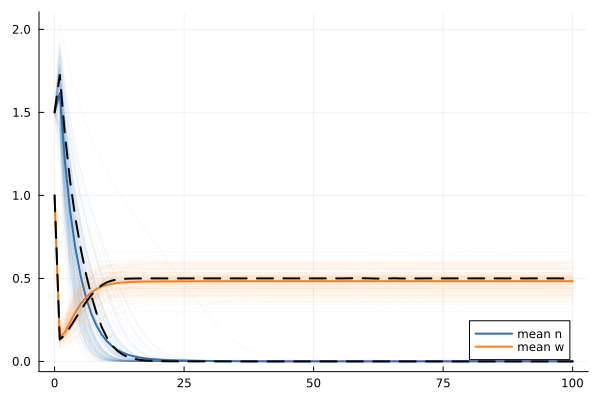

In [13]:
rf.trajectories

Biomass converges to plant-free equlibrium, whilst water stabilized around value of water input parameter a.

Conclusion: both a,m can be inferred

## fixed time window, observe in stable state only

In [9]:
# observation time window fixed
t_fixed = true

# observations in stable state only
obs_late = true
t_end = 200.0; # observe system for a longer time in this case

### infer a,m

In [20]:
# infer a,m parameter
prm_keys = [:a, :m];

In [21]:
# inverse uq and practica identifiability
rl = assess_practical_identifiability(prm_keys, hprm, t_fixed=t_fixed, obs_late=obs_late, t_end=t_end)

(mle = [0.6145971042746672, 0.311208385158761], plot_mles = Plot{Plots.GRBackend() n=12}, plot_losses = Plot{Plots.GRBackend() n=3}, cor = [1.0 0.9999345671318172; 0.9999345671317622 1.0], cov = [0.010260335339883169 0.0050481988843327705; 0.005048198884332493 0.002484094962015159], gaussian_heatmap = Plot{Plots.GRBackend() n=1}, gaussian_surface = Plot{Plots.GRBackend() n=2})

In [23]:
# forward uq
rlf = forward_uq(rl.mle, rl.cov, prm_keys, [a_true, m_true], t_fixed=t_fixed, t_end=t_end, t_pt_sample_dens=25)
# !!! Error for t_pt_sample_dens=75 ?? why array of length 50?

(trajectories = Plot{Plots.GRBackend() n=204}, sample_dens_n = Plot{Plots.GRBackend() n=2}, sample_dens_w = Plot{Plots.GRBackend() n=2})

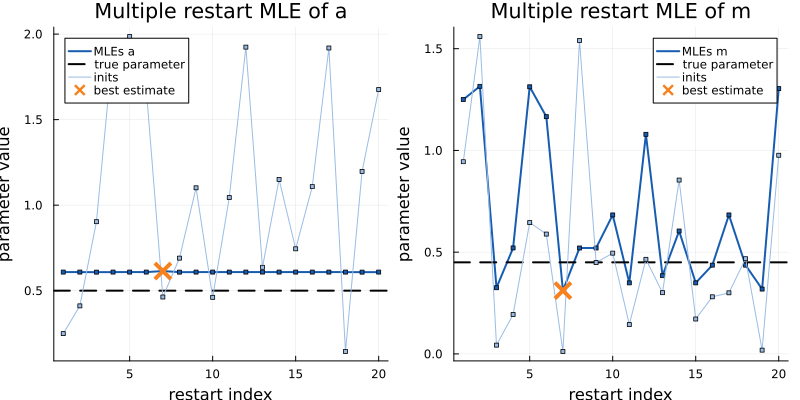

In [24]:
rl.plot_mles

apparently there are many local maxima for m

In [25]:
rl.cor

2×2 Matrix{Float64}:
 1.0       0.999935
 0.999935  1.0

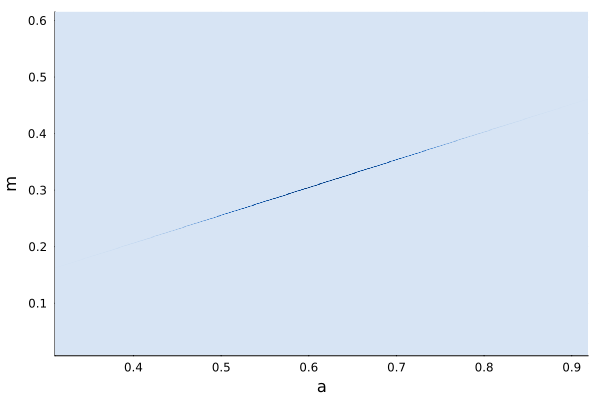

In [26]:
rl.gaussian_heatmap

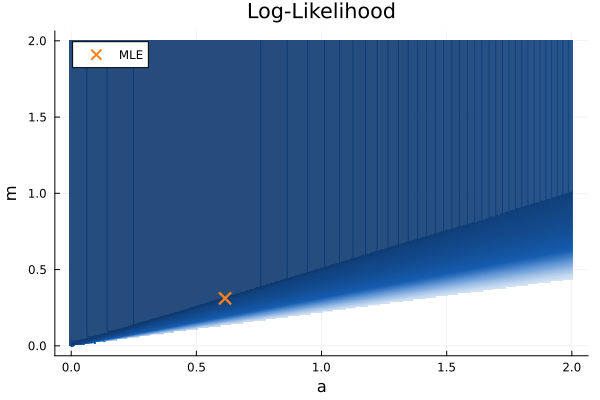

In [27]:
analyze_ll(rl.mle, prm_keys, hprm, -1000, t_fixed=t_fixed, obs_late=obs_late, t_end=200.0)

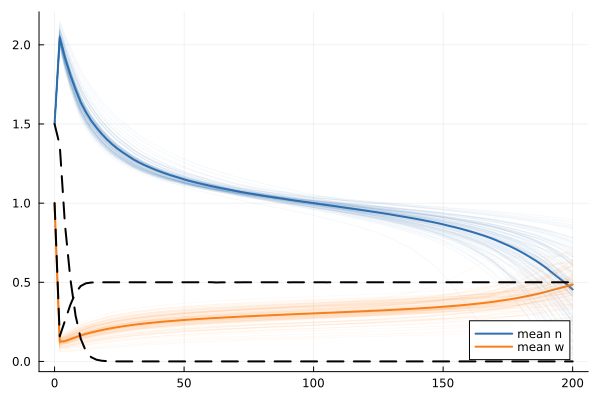

In [28]:
rlf.trajectories

likelihood is basically flat into m direction -> no unique maximum can be found.

Conclusion: a and m are not identifiable. -> try to infer only a.

### infer a

In [10]:
# infer a parameter
prm_keys = [:a];

In [11]:
# inverse uq and practica identifiability
rl = assess_practical_identifiability(prm_keys, hprm, t_fixed=t_fixed, obs_late=obs_late, t_end=t_end)

(mle = [0.35762552314824564], plot_mles = Plot{Plots.GRBackend() n=6}, plot_losses = Plot{Plots.GRBackend() n=3}, cor = [1.0;;], cov = [0.00999986869595401;;], gaussian_heatmap = nothing, gaussian_surface = Plot{Plots.GRBackend() n=1})

In [13]:
# forward uq
rlf = forward_uq(rl.mle, rl.cov, prm_keys, [a_true], t_fixed=t_fixed, t_end=t_end, t_pt_sample_dens=25)

(trajectories = Plot{Plots.GRBackend() n=204}, sample_dens_n = Plot{Plots.GRBackend() n=2}, sample_dens_w = Plot{Plots.GRBackend() n=2})

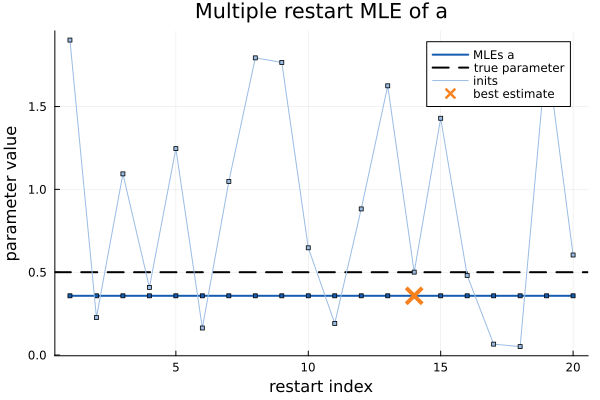

In [14]:
rl.plot_mles

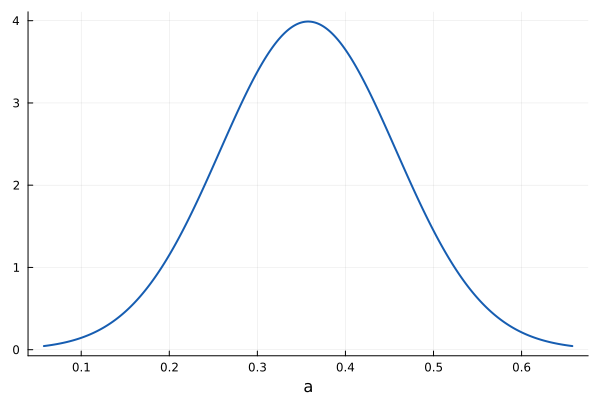

In [15]:
rl.gaussian_surface

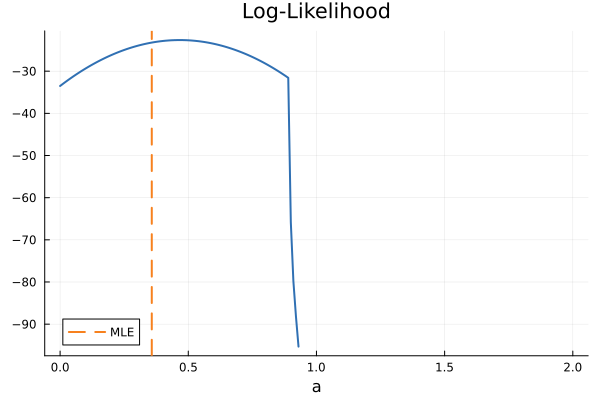

In [16]:
analyze_ll(rl.mle, prm_keys, hprm, -100, t_fixed=t_fixed, obs_late=obs_late, t_end=200.0)

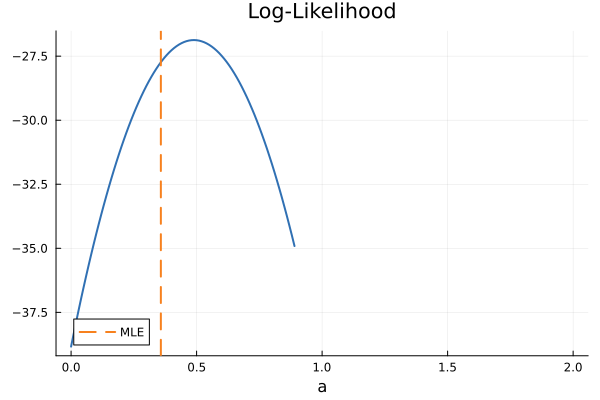

In [17]:
analyze_ll(rl.mle, prm_keys, hprm, -40, t_fixed=t_fixed, obs_late=obs_late, t_end=200.0)

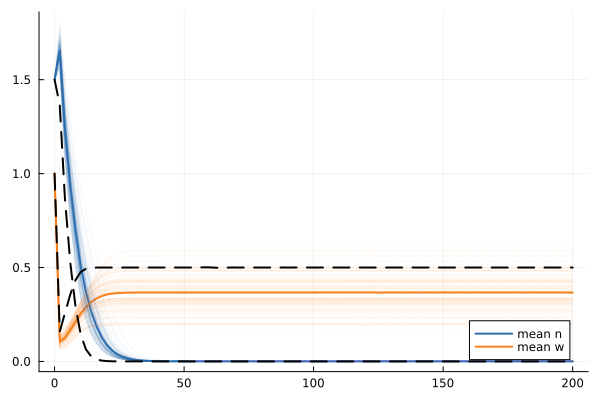

In [18]:
rlf.trajectories

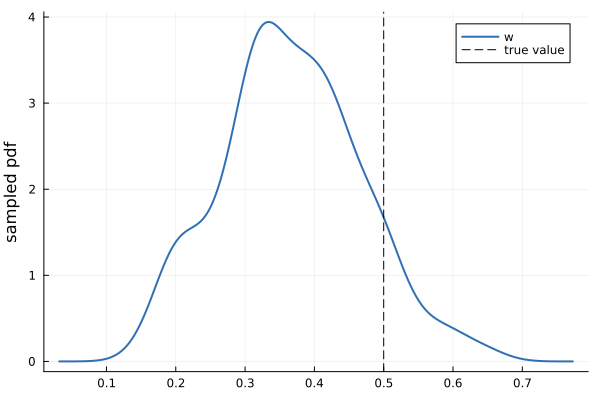

In [19]:
rlf.sample_dens_w